# Sorting Algorithms Complexity Visualization

This notebook visualizes the **time complexities** of different sorting algorithms using Plotly. The algorithms we are comparing are:

- **Comparison-based sorts**: Merge Sort, Quick Sort, Heap Sort — all have an average complexity of \(O(n \log n)\)
- **Radix Sort**: A non-comparison sort with complexity \(O(n \cdot d)\), where \(d\) is the number of digits.
- **Shell Sort**: Its complexity lies between \(O(n \log n)\) and \(O(n^2)\), depending on the gap sequence.

---

## Observations

**Comparison Sorts (Merge, Quick, Heap)**
- All grow approximately like \(O(n \log n)\).  
- They are efficient for medium to large datasets.

**Radix Sort**
- Scales as \(O(n \cdot d)\), which can be faster than \(O(n \log n)\) for small \(d\) and large \(n\).  

**Shell Sort**
- Lies between \(O(n \log n)\) and \(O(n^2)\).  
- Its performance highly depends on the gap sequence chosen.

---

### Visualization
- The animation shows how the time complexity grows as \(n\) increases.  
- The shaded area represents the possible performance range of Shell Sort.  
- Dashed lines and markers provide references for the growth of Radix and Comparison sorts.







In [3]:
import numpy as np
import plotly.graph_objects as go
n = np.linspace(1, 500, 300)
c = 0.000001
comparison =  n * np.log2(n)     
d = np.log10(n)
radix = n * d                     
shell_upper =  (n ** 2)          
shell_lower = comparison         
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=n[:1], y=shell_upper[:1],
    mode='lines',
    line=dict(width=0),
    showlegend=False
))
fig.add_trace(go.Scatter(
    x=n[:1], y=shell_lower[:1],
    mode='lines',
    line=dict(width=0),
    fill='tonexty',
    name='Shell Sort (Between O(n log n) and O(n²))'
))
fig.add_trace(go.Scatter(x=n[:1], y=comparison[:1], mode='lines', name='Comparison Sorts O(n log n)'))
fig.add_trace(go.Scatter(x=n[:1], y=radix[:1], mode='lines', name='RadixSort O(n*d)'))

for curve in [comparison, radix]:
    fig.add_trace(go.Scatter(x=[n[0]], y=[curve[0]], mode='markers', marker=dict(size=10), showlegend=False))

for curve in [comparison, radix]:
    fig.add_trace(go.Scatter(x=[n[0], n[0]], y=[0, curve[0]], mode='lines', line=dict(dash='dash'), showlegend=False))


steps = []
for i in range(len(n)):
    steps.append(dict(
        method="update",
        args=[
            {
                "x": [
                    n[:i+1],     
                    n[:i+1],     
                    n[:i+1],    
                    n[:i+1],     
                    [n[i]], [n[i]],   
                    [n[i], n[i]], [n[i], n[i]] 
                ],
                "y": [
                    shell_upper[:i+1],
                    shell_lower[:i+1],
                    comparison[:i+1],
                    radix[:i+1],
                    [comparison[i]],
                    [radix[i]],
                    [0, comparison[i]],
                    [0, radix[i]]
                ],
                "xaxis": {"range": [0, n[i]]}
            },
            {"title": f"Complexités — visible jusqu’à n = {int(n[i])}"}
        ],
        label=str(int(n[i]))
    ))

fig.update_layout(
    sliders=[dict(
        active=0,
        currentvalue={"prefix": "n = "},
        pad={"t": 50},
        steps=steps
    )],
    template="plotly_dark",
    xaxis_title="n",
    yaxis_title="Temps (unités arbitraires)",
   
)

fig.show()


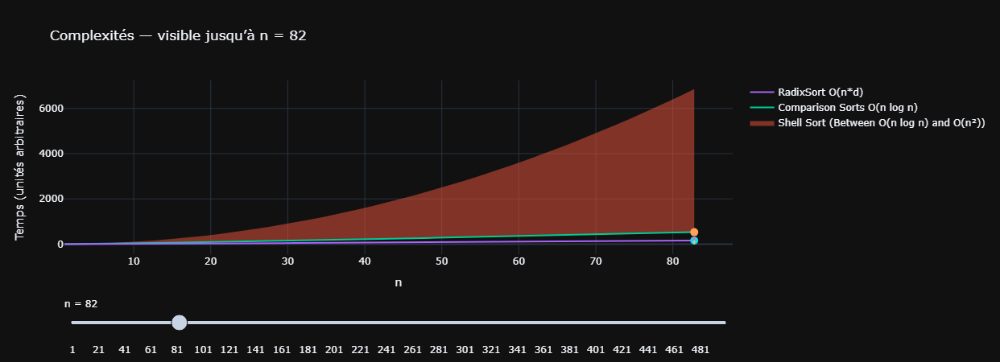

### Merge VS Heap

In [ ]:
import numpy as np
import plotly.graph_objects as go

n = np.linspace(1, 500000, 300)

merge = n * np.log2(n)
heap = n * np.log2(n)

fig_merge = go.Figure()
fig_merge.add_trace(go.Scatter(x=n, y=merge, mode='lines', name='Merge Sort O(n log n)'))
fig_merge.update_layout(
    template="plotly_dark",
    title="Merge Sort",
    xaxis_title="n",
    yaxis_title="Temps (unités arbitraires)"
)
fig_merge.show()

fig_heap = go.Figure()
fig_heap.add_trace(go.Scatter(x=n, y=heap, mode='lines', name='Heap Sort O(n log n)'))
fig_heap.update_layout(
    template="plotly_dark",
    title="Heap Sort",
    xaxis_title="n",
    yaxis_title="Temps (unités arbitraires)"
)
fig_heap.show()




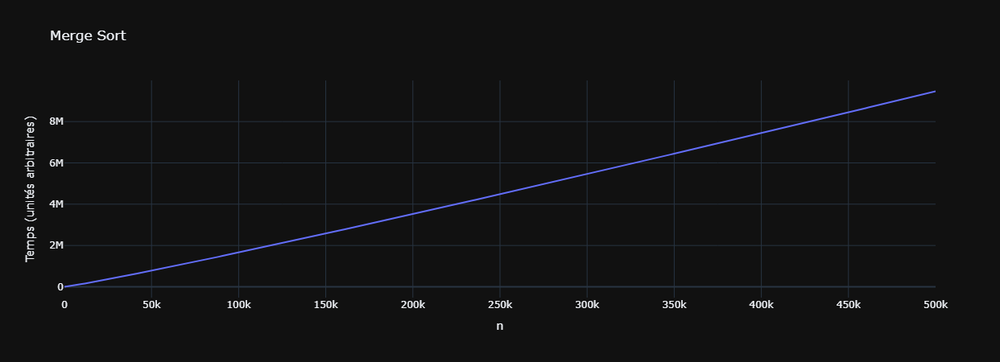

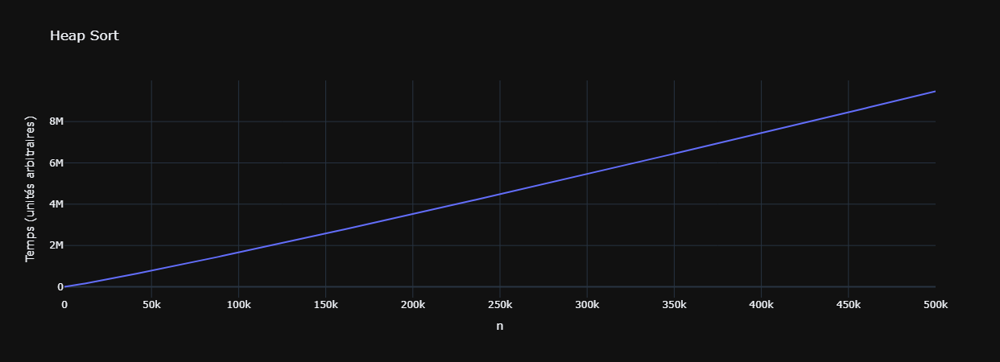